# pls work

In [1]:
import os

kaggle = False
base_dir = os.getcwd()
print(f"Base directory: {base_dir}")

### UNCOMMENT IF USING KAGGLE/COLAB ###
!pip install librosa pandas 
kaggle = True
data_dir = '/kaggle/input/fma-free-music-archive-small-medium'
###

# !pip install torch==2.6.0 #not needed?

Base directory: /kaggle/working


In [2]:
import pandas as pd
import librosa
import numpy as np
import torch
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader

print(torch.__version__)

2.5.1+cu124


In [3]:
import pandas as pd

# import the csv file
directory = data_dir if kaggle else base_dir
file_path = os.path.join(directory, 'fma_metadata', 'tracks.csv')
df_labelconvertion = pd.read_csv(file_path, index_col=1)

# rename columns to actual names
df_labelconvertion.rename(columns={'Unnamed: 0': 'track_id', 'track.7': 'genre_top'}, inplace=True)

# make df of only the important columns
df_labelconvertion = df_labelconvertion[['track_id', 'genre_top']]

# set all NA values to other 
df_labelconvertion['genre_top'] = df_labelconvertion['genre_top'].fillna('Other')

# reset index from albums to normal index
df_labelconvertion = df_labelconvertion.reset_index(drop=True)

# make all values in the track_id column strings
df_labelconvertion['track_id'] = df_labelconvertion['track_id'].astype(str)

# remove first two rows
df_labelconvertion = df_labelconvertion.iloc[2:]


df_labelconvertion


/tmp/ipykernel_31/1240877027.py:6: DtypeWarning: Columns (0,1,5,6,8,12,18,20,21,22,24,33,34,38,39,44,47,49) have mixed types. Specify dtype option on import or set low_memory=False.
  df_labelconvertion = pd.read_csv(file_path, index_col=1)


,track_id,genre_top
2,2,Hip-Hop
3,3,Hip-Hop
4,5,Hip-Hop
5,10,Pop
6,20,Other
...,...,...
106571,155316,Rock
106572,155317,Rock
106573,155318,Rock
106574,155319,Rock


In [4]:
# print unique values in the genre_top column
unique_genres = df_labelconvertion['genre_top'].unique()
print(f"Unique genres: {unique_genres}")

Unique genres: ['Hip-Hop' 'Pop' 'Other' 'Rock' 'Experimental' 'Folk' 'Jazz' 'Electronic'
 'Spoken' 'International' 'Soul-RnB' 'Blues' 'Country' 'Classical'
 'Old-Time / Historic' 'Instrumental' 'Easy Listening']


In [5]:
import os

df_labelnumber = pd.DataFrame(columns=['labelnumber', 'unique genres'])
labelnumber = {}
for i, genre in enumerate(unique_genres):
    labelnumber[genre] = i
    
df_labelnumber = pd.DataFrame(labelnumber, index=[0])
# make rows into columns
df_labelnumber = df_labelnumber.transpose()

# save to csv file
os.makedirs("fma_metadata", exist_ok=True)
file_path = os.path.join(base_dir, 'fma_metadata', 'labelnumber.csv')
df_labelnumber.to_csv(file_path, index= True)


In [6]:
df_labelnumbers = pd.read_csv('fma_metadata/labelnumber.csv')

df_labelnumbers.rename(columns={'Unnamed: 0': 'genre', '0': 'number'}, inplace=True)

df_labelnumbers

,genre,number
0,Hip-Hop,0
1,Pop,1
2,Other,2
3,Rock,3
4,Experimental,4
5,Folk,5
6,Jazz,6
7,Electronic,7
8,Spoken,8
9,International,9


In [7]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import os
import contextlib
import sys
import torch

@contextlib.contextmanager
def suppress_stderr():
    with open(os.devnull, 'w') as devnull:
        old_stderr = sys.stderr
        sys.stderr = devnull
        try:
            yield
        finally:
            sys.stderr = old_stderr

class SpectrogramDataset(Dataset):
    def __init__(self, file_paths, sr=44100, n_fft=1024, hop_length=512, window='hann', transform=None):
        self.sr = sr
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.window = window
        self.transform = transform
        self.file_paths = file_paths
                    
    def __len__(self):
        return len(self.file_paths)
    
    def __getitem__(self, idx):
        file_path = self.file_paths[idx]
        # with suppress_stderr():
        #    y, sr = librosa.load(file_path, sr=self.sr, mono = True)
        # y = y[:10 * self.sr]
        # D = librosa.stft(y, n_fft=self.n_fft, hop_length=self.hop_length, window=self.window)

        D = np.load(file_path)
        
        D_real = np.real(D)
        D_imag = np.imag(D)
        
        # Normalize
        # D_real = (D_real - D_real.min()) / (D_real.max() - D_real.min() + 1e-8) * 2 - 1
        # D_imag = (D_imag - D_imag.min()) / (D_imag.max() - D_imag.min() + 1e-8) * 2 - 1
        # D_real_mean = -0.00022800823861055075
        # D_real_std = 3.1135954811248605
        # D_imag_mean = -2.303626924950437e-08
        # D_imag_std = 2.8981973344661305

        # D_real = (D_real - D_real_mean) / (16 * (D_real_std + 1e-8))
        # D_imag = (D_imag - D_imag_mean) / (16 * (D_imag_std + 1e-8))
        
        D_real = torch.tensor(D_real, dtype=torch.float32)
        D_imag = torch.tensor(D_imag, dtype=torch.float32)
        
        # concat real and imaginary parts to 2 channels
        D = torch.stack((D_real, D_imag), dim=0)
        # Normalize, after stack to normalize both channels equaly
        # D = (D - D.mean()) / (D.std() + 1e-8)
        
        # get the label from the file name and convert to genre
        track_id = os.path.basename(file_path).replace('.npy', '').lstrip('0')
        # try to get the label from the dataframe
        try:
            # label = df_labelconvertion.query('track_id == @track_id')['genre_top'].values[0]
            label = df_labelconvertion.query('track_id == @track_id')['genre_top'].values[0]
            label = torch.tensor(df_labelnumbers.query('genre == @label')['number'].values[0])
        except IndexError:
            # if not found, set label to 'Other'
            print(f"Track ID: {track_id} not found in dataframe")
            label = 'Other'
        
        return D, label

In [8]:
file_directory = '/kaggle/input/fma-stft-spectrograms'

# train test split
from sklearn.model_selection import train_test_split
import soundfile as sf

# get all file paths
file_paths = []
for root, _, files in os.walk(file_directory):
    for file in files:
        if file.endswith('.npy'):
            file_paths.append(os.path.join(root, file))
            
# split the file paths into train and test
train_paths, test_paths = train_test_split(file_paths, test_size=0.2, random_state=42)





In [9]:
# print an example file path

index = np.random.randint(0, len(file_paths))
track = os.path.basename(file_paths[index]).replace('.npy', '').lstrip('0')
print(track)
label = df_labelconvertion.query('track_id == @track')['genre_top'].values[0]
print(label)

18787
Rock


In [10]:
# create dataloader
batch_size = 24
num_workers = 4

num_workers = num_workers if kaggle else 0

# create a subset
subset = True
from torch.utils.data import random_split

train_dataset = SpectrogramDataset(train_paths)
test_dataset = SpectrogramDataset(test_paths)

print(len(train_dataset))
print(len(test_dataset))

if subset:
    #subset_size = batch_size * 625
    subset_size = batch_size * 70
    print(subset_size)
    train_subset, _ = random_split(train_dataset, [subset_size, len(train_dataset) - subset_size])
    test_subset, _ = random_split(test_dataset, [int(subset_size * 0.2), len(test_dataset) - int(subset_size * 0.2)])
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=kaggle)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=kaggle)
else:
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=kaggle)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=kaggle)

print(len(train_dataloader))
print(len(test_dataloader))

19984
4996
1680
70
14


In [11]:
# check the shape of the data
for batch in train_dataloader:
    print(batch[0].shape)
    print(batch[0].max(),batch[0].min())
    print(batch[1].shape)
    break

torch.Size([24, 2, 513, 862])
tensor(4.3213) tensor(-4.5668)
torch.Size([24])


In [12]:
import sys
import gc
import shutil

if kaggle:
    sys.path.append('/kaggle/input/cvae-actual-i-think')

import cvae_actual_i_think
import importlib
importlib.reload(cvae_actual_i_think) # Reload the cvae module to ensure it's up to date

#del model, trainer# , logger, best_callback, early_stop_callback #periodic_callback,
gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()
torch.cuda.reset_peak_memory_stats()

from pytorch_lightning import Trainer
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.utilities.model_summary import summarize

# Logger for saving training metrics
logger = CSVLogger("logs", name="cvae_training_metrics", version=0)
# logger = CSVLogger("logs", name="cvae_training_metrics")

checkpoint_dir = "checkpoints"

# Checkpoint callback to save the best model
periodic_callback = ModelCheckpoint(
    dirpath=checkpoint_dir,
    filename="{epoch:02d}-{val_loss:.2f}",
    save_top_k=-1,
    every_n_epochs=10,
    save_weights_only=False,
)

# Checkpoint callback to save the best model
best_callback = ModelCheckpoint(
    dirpath=checkpoint_dir,
    filename="Best-{epoch:02d}-{val_loss:.2f}",
    monitor="val_loss",
    mode="min",
    save_top_k=1,
    save_weights_only=False,
)

# Early stopping callback to stop training when validation loss doesn't improve
early_stop_callback = EarlyStopping(monitor="val_loss", mode="min", patience=10)

# Initialize the PyTorch Lightning Trainer
trainer = Trainer(
    max_epochs=500, 
    accelerator="gpu", 
    devices=1, 
    logger=logger, 
    callbacks=[periodic_callback, best_callback, early_stop_callback],
    enable_model_summary = True,
    # accumulate_grad_batches = 2, #one of these two needed with current network
    #precision = "16-mixed",
)


##########################################
model = cvae_actual_i_think.ConvCVAEPL(latent_size = 512, learning_rate = 1e-4, ramp_beta = True)
# model = cvae_actual_i_think.ConvCVAEPL.load_from_checkpoint("best_last.ckpt", latent_size = 128, learning_rate = 1e-4, beta = 1, ramp_beta = False)
##########################################

######### Reset checkpoint dir ###########
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

os.makedirs(checkpoint_dir)
##########################################

# Train the model
import time
print(model)
print(summarize(model))
start_time = time.time()
print("Training started")

trainer.fit(model, train_dataloader, val_dataloaders=test_dataloader)

print("Training finished")
end_time = time.time()
print(f"Training time: {(end_time - start_time):.3f} seconds")

ConvCVAEPL(
  (model): ConvCVAE(
    (encoder_conv1): Conv2d(19, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (max_pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (encoder_batch_norm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder_conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (max_pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (encoder_batch_norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder_conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (max_pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (encoder_batch_norm3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder_conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (max_pool4): M

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 0], Beta: 0.0064, Train Loss: 54050.8945, Recon: 54049.7812, KLD: 175.2301 , Val Loss: 15434.6045
Generated sample for label 16


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 1], Beta: 0.0082, Train Loss: 12373.4570, Recon: 12366.2002, KLD: 883.7372 , Val Loss: 12768.1611


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 2], Beta: 0.0105, Train Loss: 11861.9453, Recon: 11845.3135, KLD: 1578.1897 , Val Loss: 12594.3896
Generated sample for label 5


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 3], Beta: 0.0135, Train Loss: 11516.2520, Recon: 11489.3311, KLD: 1989.2805 , Val Loss: 12243.0361


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 4], Beta: 0.0174, Train Loss: 11391.2969, Recon: 11353.5107, KLD: 2174.4316 , Val Loss: 12131.0771
Generated sample for label 7


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 5], Beta: 0.0223, Train Loss: 11274.1445, Recon: 11226.3662, KLD: 2141.3677 , Val Loss: 12062.0586


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 6], Beta: 0.0287, Train Loss: 11259.5986, Recon: 11203.3115, KLD: 1964.6152 , Val Loss: 12065.2822
Generated sample for label 9


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 7], Beta: 0.0368, Train Loss: 11202.6104, Recon: 11139.2354, KLD: 1722.7507 , Val Loss: 12081.5107


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 8], Beta: 0.0472, Train Loss: 11251.8037, Recon: 11182.8877, KLD: 1458.9180 , Val Loss: 12121.2207
Generated sample for label 7


Validation: |          | 0/? [00:00<?, ?it/s]

[Epoch 9], Beta: 0.0607, Train Loss: 11370.4424, Recon: 11299.4121, KLD: 1171.0906 , Val Loss: 12104.4590


NameError: name 'exit' is not defined

In [ ]:
# shutil.make_archive('/kaggle/working/checkpoints_backup', 'zip', '/kaggle/working/checkpoints')

In [13]:
# Load best model weights after training
best_model_path = best_callback.best_model_path
model = cvae_actual_i_think.ConvCVAEPL.load_from_checkpoint(best_model_path, latent_size = 512, learning_rate = 1e-4)

# model.save_checkpoint("best.ckpt")
# Save model weights to a file (PyTorch format)
torch.save(model.state_dict(), "/kaggle/working/best_model_weights_1.pth")

In [ ]:
trainer.save_checkpoint("last.ckpt")

In [ ]:
# model = cvae_actual_i_think.ConvCVAEPL.load_from_checkpoint("val_3399.ckpt", latent_size = 64, learning_rate = 1e-4)

# start_time = time.time()
# print("Training started")

# trainer.fit(model, train_dataloader, val_dataloaders=test_dataloader)
# print("Training finished")
# end_time = time.time()
# print(f"Training time: {(end_time - start_time):.3f} seconds")

### Load model

In [12]:
if kaggle:
    sys.path.append('/kaggle/input/cvae-actual-i-think')
    
import cvae_actual_i_think
import importlib
importlib.reload(cvae_actual_i_think) # Reload the cvae module to ensure it's up to date

model_path = "/kaggle/input/music_cvae/pytorch/default/1/last (2).ckpt"
model = cvae_actual_i_think.ConvCVAEPL.load_from_checkpoint(model_path, latent_size = 512, learning_rate = 1e-4)

## Plot training data

In [16]:
import matplotlib.pyplot as plt

metrics = pd.read_csv(os.path.join(logger.log_dir, "metrics.csv")).ffill()

def plot_training_metrics(metrics):
    """Plot training metrics by epoch."""

    plt.plot(metrics["epoch"], metrics["train_loss"], label="Train Loss")
    plt.plot(metrics["epoch"], metrics["val_loss"], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss of CVAE")
    plt.grid()
    plt.legend()
    
    plt.show()

plot_training_metrics(metrics)

NameError: name 'logger' is not defined

In [ ]:
# model = cvae_actual_i_think.ConvCVAEPL.load_from_checkpoint("checkpoints/.ckpt")

## Generate samples

In [18]:
import matplotlib.pyplot as plt
import IPython.display as ipd

def plot_spectogram(D_real, D_imag, save_name, clean_axis = False):

    # D_real = D_channels[0].cpu().detach().numpy()
    # D_imag = D_channels[1].cpu().detach().numpy()
    D_real_mean = -0.00022800823861055075
    D_real_std = 3.1135954811248605
    D_imag_mean = -2.303626924950437e-08
    D_imag_std = 2.8981973344661305

    D_real = (D_real * (D_real_std + 1e-8) * 16) + D_real_mean
    D_imag = (D_imag * (D_imag_std + 1e-8) * 16) + D_imag_mean

    D = D_real + 1j * D_imag

    # plot the spectrogram using librosa
    sr = 44100
    plt.figure(figsize=(7, 5))
    librosa.display.specshow(librosa.amplitude_to_db(D_real, ref=np.max), sr=sr, x_axis='time', y_axis='log')
    if clean_axis:
        plt.axis("off")
    else:
        plt.title('Spectrogram')
        plt.colorbar(format='%+2.0f dB')
        
    plt.savefig(save_name, bbox_inches='tight', pad_inches=0)
    plt.show()
    
    # convert to audio
    y = librosa.core.istft(D, hop_length=512, win_length=1024, window='hann')
    
    # # save audio
    # sf.write('sample.mp3', y, sr)

    return y,sr
    # # play the audio
    # ipd.Audio(y, rate= sr)

tensor([13])
cpu


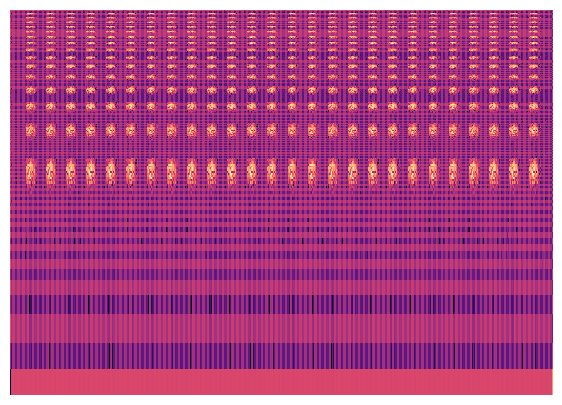

In [83]:
import numpy as np
import soundfile as sf

importlib.reload(cvae_actual_i_think) # Reload the cvae module to ensure it's up to date

label = np.array([13])
z = np.random.rand(1,model.model.latent_size)*2-1

# print(torch.from_numpy(z).float())
print(torch.from_numpy(label))

# device = torch.device("cuda" if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else "cpu"))
# print(device)
print(model.device)
z = torch.from_numpy(z).float().to(model.device)
labels = torch.tensor(label).to(model.device)

generated_images = model.model.sample(z, labels)

D_real = generated_images[0][0].cpu().detach().numpy()
D_imag = generated_images[0][1].cpu().detach().numpy()

y, sr = plot_spectogram(D_real, D_imag, "classical.png", clean_axis = True)

# save audio
sf.write('sample.mp3', y, sr)

# play the audio
import IPython.display as ipd
ipd.Audio(y, rate= sr)

In [ ]:
print(os.listdir("/kaggle/working/checkpoints"))

In [ ]:
from_dir = "/kaggle/working/checkpoints/Best-epoch=31-val_loss=3421.40.ckpt"
to_dir = "/kaggle/working/Best-epoch=31-val_loss=3421.40.ckpt"
shutil.move(from_dir, to_dir)

### rECONSTRUCT SPECTORGRAM

Real spectrogram from genre:  11


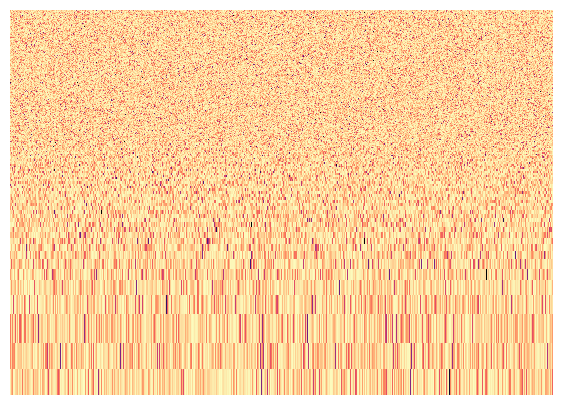

In [74]:
import random

# Real spectogram
# index = random.randint(0, len(train_dataset) - 1)
# D,label = train_dataset[index]
# print(label)

# Random noise
label = torch.randint(0,(len(unique_genres)), (1,))[0]
D = 2 * torch.rand(2, 513, 862) - 1
# print(D.shape)
# print(label)

# print(D)
# print(label)

print("Real spectrogram from genre: ",label.cpu().detach().numpy())

D_real = D[0].cpu().detach().numpy()
D_imag = D[1].cpu().detach().numpy()

y,sr = plot_spectogram(D_real, D_imag, "real_noise.png", True)
sf.write('real_sample.mp3', y, sr)
ipd.Audio(y, rate = sr)

Reconstructed spectrogram from genre:  11


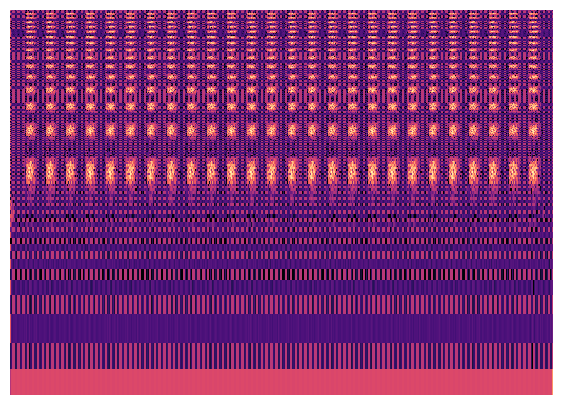

In [75]:
# Reconstruct
label = label.to(model.device)
print("Reconstructed spectrogram from genre: ",label.cpu().detach().numpy())
# print(D.unsqueeze(0).shape)
reconstructed_image, _, _ = model.model.forward(D.unsqueeze(0), label.unsqueeze(0))
# print(reconstructed_image.shape)
D_real = reconstructed_image[0][0].cpu().detach().numpy()
D_imag = reconstructed_image[0][1].cpu().detach().numpy()

y,sr = plot_spectogram(D_real, D_imag, "recon_noise.png", True)
sf.write('recon_sample.mp3', y, sr)
ipd.Audio(y, rate = sr)